# **explainable AI methods** (XAI)
A collection of XAI methods (mostly) for CNNs. Contributors are participants of the CZS summer school 2023 in Heidelberg.

Check out the two tutorials for grad-CAMs using the MNIST dataset and a labelled SDSS galaxy dataset, both are available online. The latter has an unsatisfying accuracy, some more hyperparameter optimisation would be necessary here.

## CAMs (Class Acitvation Maps)
They require a very specific CNN architecture, only using convolutional layers and with a GAP (Global Activation Pooling) before the classification. Then the CAMs are using the weights combined with the respective final feature map to produce a heatmap for each class.

The required architecture looks like this: (from https://johfischer.com/2022/01/27/class-activation-maps/)
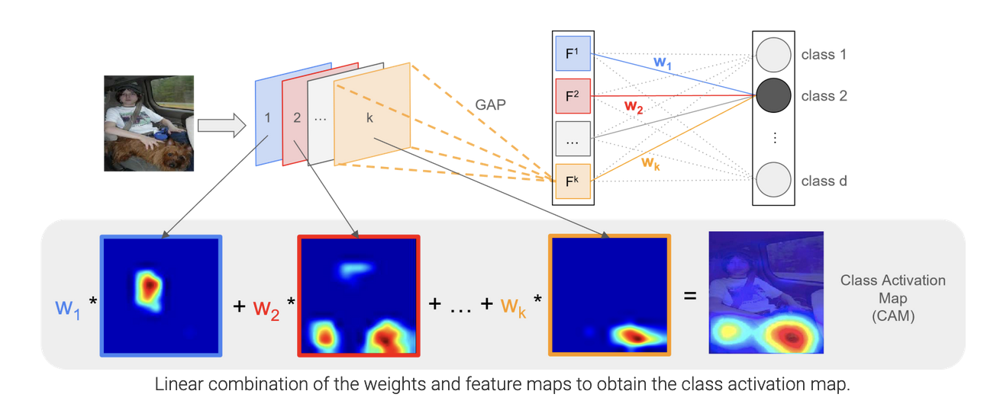


## Grad-CAM
The grad-CAM is a generalisation of CAMs for more complicated architectures. They can contain dense layers or other layers inbetween the final convolution layer and the classification step.

The popular architecture of a classifying CNN like the following one can be analysed with grad-CAMs (from https://johfischer.com/2022/01/27/class-activation-maps/)

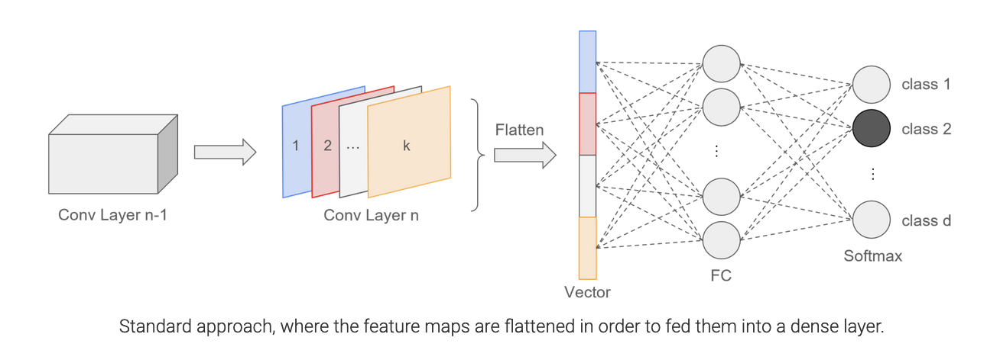

other supported architectures are (from the original paper https://arxiv.org/abs/1610.02391)

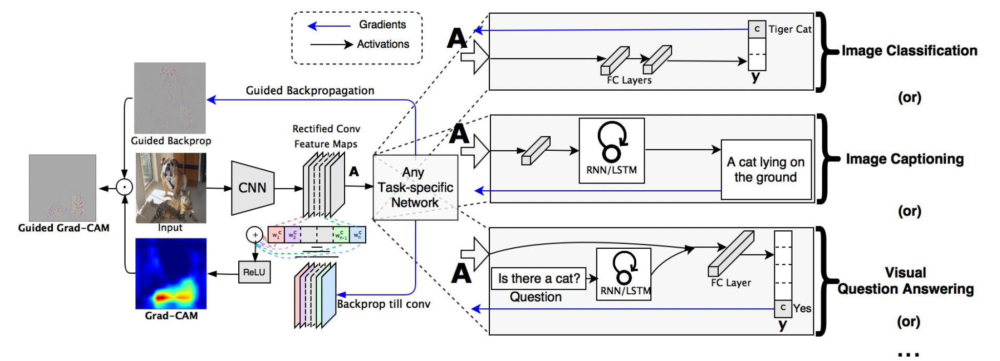


ELI5: https://eli5.readthedocs.io/en/latest/autodocs/keras.html

eli5 requires tensorflow v1 which is not longer supported by google colab
-> cannot be used anymore

## Saliency maps

## VAE's (variational autoencoders) and UMAP
VAE's compress or 'encode' the existing data into a low dimension latent space which is a representation of the higher dimensional data. From this latent space you can do several things:

1. You can build a decoder which attempts to reconstruct the original data and alter the latent space dimensions and inspect how each of the dimensions effects the decoded image. See: https://watermark.silverchair.com/stac2105.pdf?token=AQECAHi208BE49Ooan9kkhW_Ercy7Dm3ZL_9[…]JHd42y-s3UBMl4bcOrLY66KUVe69FG6vX9xGNIn9na6dEkjdLb7pklZE


1.   List item
2.   List item


2. You can use a package called UMAP to visually describe the latent space. This is very similar to PCA and easy to implement. See: https://openreview.net/pdf?id=L8pZq2eRWvX

3. The paper above is a rather unique example because of the specific architecture used. The architecture is designed with explainability in mind and thus the VAE has been constructed differently. However, the implementation of the UMAP still holds in other model types, however, the rest of the paper goes into detail about how this model was built to maintain transparency across the entire process so is worth looking into further.

## Visualising filters in the CNN :
https://keras.io/examples/vision/visualizing_what_convnets_learn/

### Shapley numbers and other CAM methods

Check out this paper: https://www.ecva.net/papers/eccv_2022/papers_ECCV/papers/136720455.pdf .

They have introduced another method to implement Class Activation Maps: the SHAP-CAM (using the Shapley Additive Explanations). No git repository for the algorithm is available on the web though. You'll find other CAMs mentioned in this paper, like the Score-CAM. https://github.com/tabayashi0117/Score-CAM contains a git repository with implementations for different CAMs : (https://github.com/tabayashi0117/Score-CAM.git).

Shap values
https://github.com/shap/shap

# **Tutorials**

## grad-CAMs for MNIST numbers

grad-CAMs for CNNs, using ELI5 in tensorflow v1, **doesn't work for tensorflow v2** (cannot be used in colab )

https://coderzcolumn.com/tutorials/artificial-intelligence/eli5-explain-keras-image-classifier-predictions-using-grad-cam

Keras Tutorial
gradCAM

https://keras.io/examples/vision/grad_cam/


Here is a Frankenstein monster based on both of the above tutorials:

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow import keras
import numpy as np


Data preparation. Here MNIST:

In [ ]:
(X_train, Y_train), (X_test, Y_test) = keras.datasets.mnist.load_data()

X_train, X_test = X_train.reshape(-1,28,28,1), X_test.reshape(-1,28,28,1)

X_train, X_test = X_train/255.0, X_test/255.0

classes =  np.unique(Y_train)
class_labels = ["0","1","2","3","4","5","6","7","8","9"]
mapping = dict(zip(classes, class_labels))

X_train.shape, X_test.shape, Y_train.shape, Y_test.shape

11490434/11490434 [==============================] - 1s 0us/step


((60000, 28, 28, 1), (10000, 28, 28, 1), (60000,), (10000,))

Model setup. Note the name of the last convolutional layer.

In [ ]:
model = Sequential([
    layers.Input(shape=X_train.shape[1:]),
    layers.Conv2D(filters=32, kernel_size=(3,3), padding="same", activation="relu"),
    layers.Conv2D(filters=16, kernel_size=(3,3), padding="same", activation="relu"),
    layers.Conv2D(filters=8, kernel_size=(3,3), padding="same", activation="relu", name='last_conv_layer'),

    layers.Flatten(),
    layers.Dense(len(classes), activation="softmax")
])

model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        320       
                                                                 
 conv2d_1 (Conv2D)           (None, 28, 28, 16)        4624      
                                                                 
 last_conv_layer (Conv2D)    (None, 28, 28, 8)         1160      
                                                                 
 flatten (Flatten)           (None, 6272)              0         
                                                                 
 dense (Dense)               (None, 10)                62730     
                                                                 
Total params: 68,834
Trainable params: 68,834
Non-trainable params: 0
_________________________________________________________________


Model training

In [ ]:
model.compile("adam", "sparse_categorical_crossentropy", ["accuracy"])
model.fit(X_train, Y_train, batch_size=256, epochs=8, validation_data=(X_test, Y_test))

Epoch 1/8
235/235 [==============================] - 19s 12ms/step - loss: 0.3207 - accuracy: 0.9131 - val_loss: 0.1082 - val_accuracy: 0.9677
Epoch 2/8
235/235 [==============================] - 2s 10ms/step - loss: 0.1016 - accuracy: 0.9697 - val_loss: 0.0745 - val_accuracy: 0.9766
Epoch 3/8
235/235 [==============================] - 2s 9ms/step - loss: 0.0783 - accuracy: 0.9763 - val_loss: 0.0683 - val_accuracy: 0.9790
Epoch 4/8
235/235 [==============================] - 2s 9ms/step - loss: 0.0623 - accuracy: 0.9808 - val_loss: 0.0567 - val_accuracy: 0.9812
Epoch 5/8
235/235 [==============================] - 2s 9ms/step - loss: 0.0509 - accuracy: 0.9848 - val_loss: 0.0579 - val_accuracy: 0.9812
Epoch 6/8
235/235 [==============================] - 2s 9ms/step - loss: 0.0432 - accuracy: 0.9869 - val_loss: 0.0568 - val_accuracy: 0.9805
Epoch 7/8
235/235 [==============================] - 2s 10ms/step - loss: 0.0389 - accuracy: 0.9881 - val_loss: 0.0520 - val_accuracy: 0.9838
Epoch 8/8

Performance checks

313/313 [==============================] - 1s 3ms/step
Test Accuracy : 0.9857

Classification Report :
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       980
           1       1.00      0.99      0.99      1135
           2       0.98      0.98      0.98      1032
           3       0.97      0.99      0.98      1010
           4       0.99      0.99      0.99       982
           5       0.99      0.98      0.98       892
           6       0.99      0.98      0.99       958
           7       0.98      0.99      0.98      1028
           8       0.97      0.98      0.98       974
           9       0.99      0.97      0.98      1009

    accuracy                           0.99     10000
   macro avg       0.99      0.99      0.99     10000
weighted avg       0.99      0.99      0.99     10000


Confusion Matrix : 


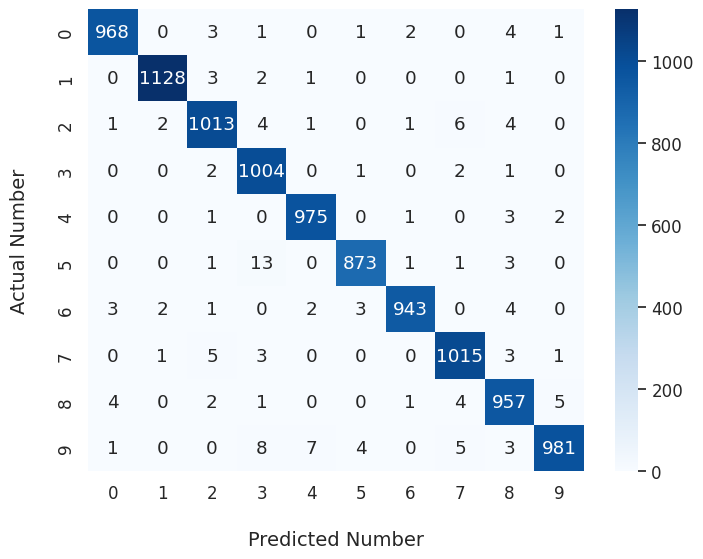

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

Y_test_preds = model.predict(X_test)
Y_test_preds = np.argmax(Y_test_preds, axis=1)

print("Test Accuracy : {}".format(accuracy_score(Y_test, Y_test_preds)))


print("\nClassification Report :")
print(classification_report(Y_test, Y_test_preds, target_names=class_labels))

print("\nConfusion Matrix : ")


plt.figure(figsize=(8,6), dpi=100)
sns.set(font_scale = 1.1)
cf_mat = confusion_matrix(Y_test, Y_test_preds)
ax = sns.heatmap(cf_mat, annot=True,
            fmt='d', cmap='Blues')
ax.set_ylabel("Actual Number", fontsize=14, labelpad=20)
ax.set_xlabel("Predicted Number", fontsize=14, labelpad=20)
plt.show()


CAM function copy-pasted from https://keras.io/examples/vision/grad_cam/

In [ ]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

Visualization of heatmap for one test example.

In [ ]:
example_id = 1

imtest = np.expand_dims(X_test[example_id], axis = 0)
Y_test_preds = model.predict(imtest)

1/1 [==============================] - 0s 32ms/step


In [ ]:
last_conv_layer_name = "last_conv_layer"
heatmap = make_gradcam_heatmap(imtest, model, last_conv_layer_name)

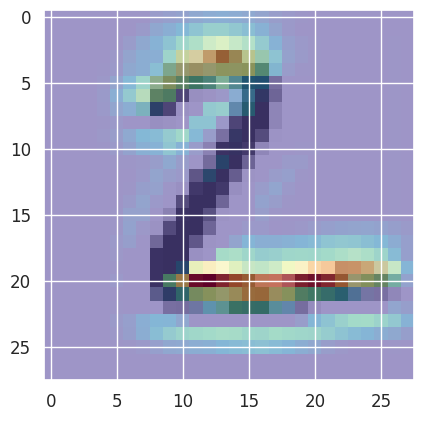

In [ ]:
plt.imshow(np.squeeze(imtest), cmap='Greys')
plt.imshow(heatmap, cmap='Spectral_r', alpha=0.6 )

plt.show()

TESTING FOR THE OTHER CAM METHODS

# Galaxy classifier
https://towardsdatascience.com/galaxy-multi-image-classification-with-lenet-5-1bc2f66d3cfc

The public **Galaxy10 dataset** https://astronn.readthedocs.io/en/v1.0.0/galaxy10.html

In [ ]:
#! pip install astroNN
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np
from tensorflow import keras

from keras.models import Sequential
from keras.layers import Conv2D, AveragePooling2D, Flatten, Dense, Dropout
from keras.callbacks import ReduceLROnPlateau
from keras.optimizers import Adam

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,confusion_matrix
from tensorflow.keras import utils

from astroNN.datasets import galaxy10
from astroNN.datasets.galaxy10 import galaxy10cls_lookup

In [ ]:
images, labels = galaxy10.load_data()

/root/.astroNN/datasets/Galaxy10_DECals.h5 was found!


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(images, labels, train_size = 0.1, test_size=0.02)

In [ ]:
features = ['Disk, Face-on, No Spiral', 'Smooth, Completely round', 'Smooth, in-between round', 'Smooth, Cigar shaped', 'Disk, Edge-on, Rounded Bulge', 'Disk, Edge-on, Boxy Bulge',
            'Disk, Edge-on, No Bulge','Disk, Face-on, Tight Spiral', 'Disk, Face-on, Medium Spiral', 'Disk, Face-on, Loose Spiral']

In [ ]:
x_train = x_train / 255.0
x_test = x_test / 255.0

In [ ]:
x_train.shape, x_test.shape#  full galaxy10 set would be ((17428, 69, 69, 3), (4357, 69, 69, 3)), but we only use subset

((1773, 256, 256, 3), (355, 256, 256, 3))

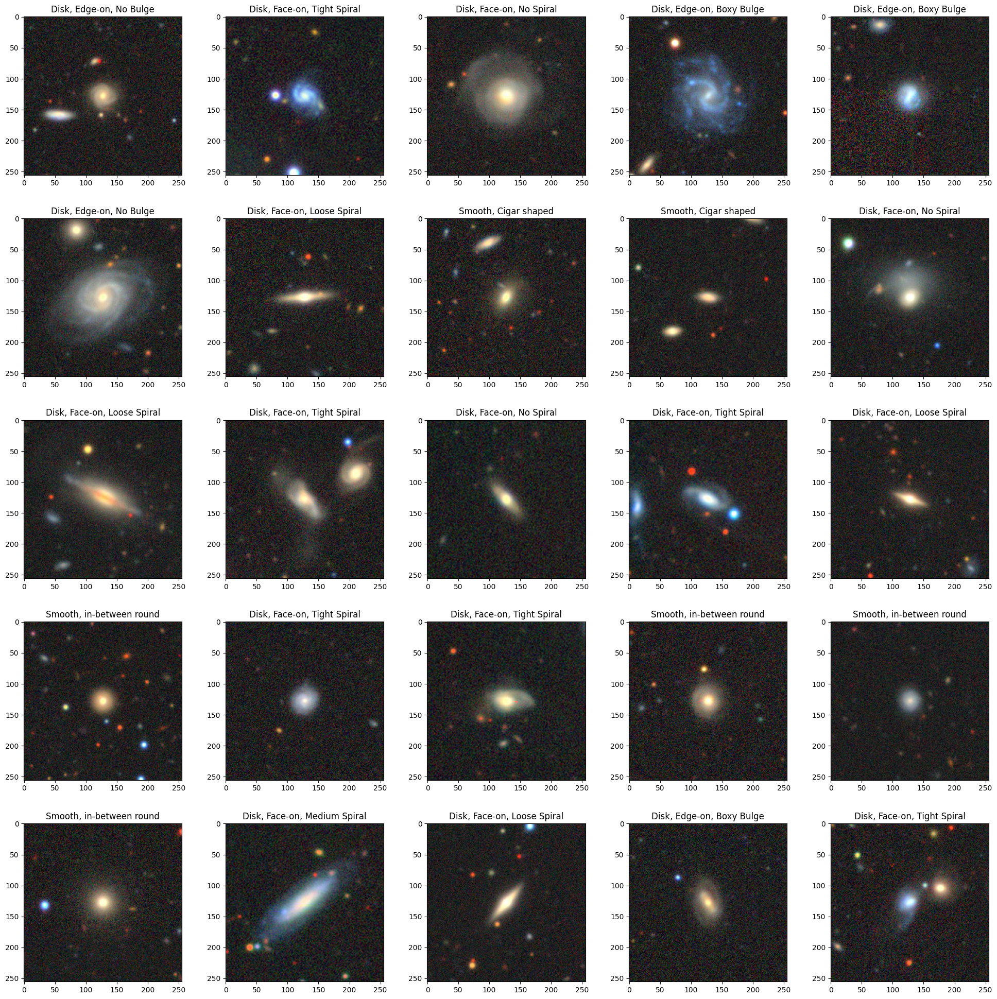

In [ ]:
fig = plt.figure(figsize=(20,20))

for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(x_train[i])
    plt.title(features[y_train[i]])
    fig.tight_layout(pad=3.0)

plt.show()

In [ ]:
# Check class distribution

df = pd.DataFrame(data=labels)

counts = df.value_counts().sort_index()
print(counts)

0    1081
1    1853
2    2645
3    2027
4     334
5    2043
6    1829
7    2628
8    1423
9    1873
dtype: int64


<ipython-input-11-f05667dac736>:4: UserWarning: FixedFormatter should only be used together with FixedLocator


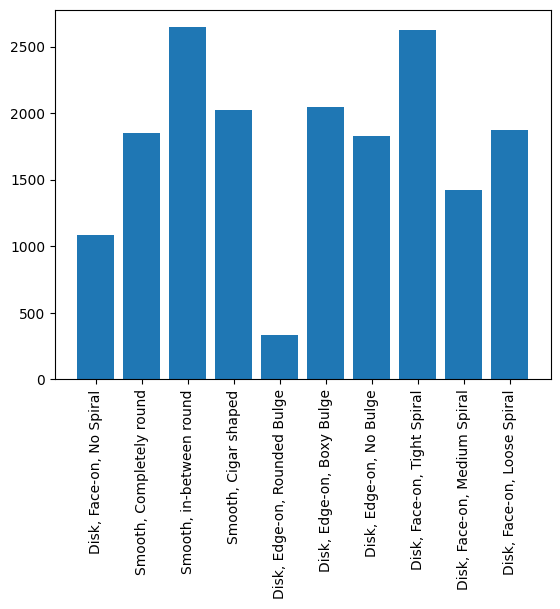

In [ ]:
def class_distribution(x, y, labels):
    fig, ax = plt.subplots()
    ax.bar(x, y)
    ax.set_xticklabels(labels, rotation=90)
    plt.show()

class_distribution(features, counts, features)

### building the LeNet5 model
http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf

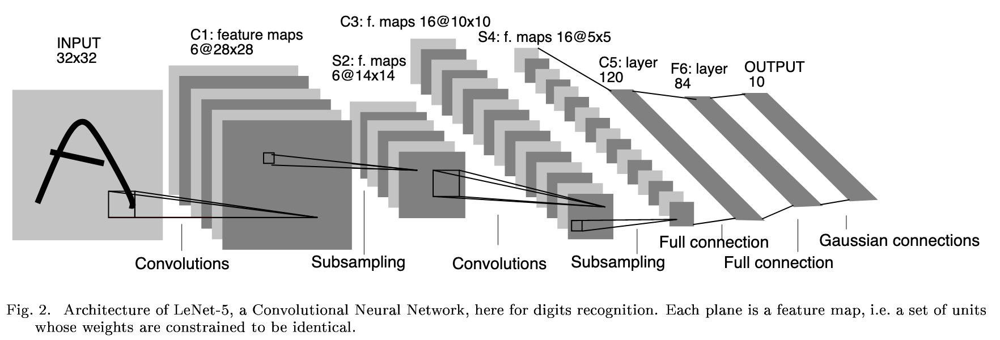

In [ ]:
model2 = Sequential()

# LeNet-5 conv-net architecture
model2.add(Conv2D(filters=6, kernel_size=(5,5), strides=(1,1), activation='tanh', input_shape=(256, 256, 3)))
model2.add(AveragePooling2D(pool_size=(2,2), strides=(2,2)))
model2.add(Conv2D(filters=16, kernel_size=(5,5), strides=(1,1), activation='tanh'))
model2.add(AveragePooling2D(pool_size=(2,2), strides=(2,2)))

model2.add(Flatten())
model2.add(Dense(units=120, activation='tanh'))
model2.add(Dense(units=84, activation='tanh'))
model2.add(Dense(units=10, activation='softmax'))

model_optimizer = Adam(lr=0.001)

reduceLR = ReduceLROnPlateau(monitor='accuracy', factor=.001, patience=1, min_delta=0.01, mode="auto")

model2.compile(optimizer=model_optimizer, loss='sparse_categorical_crossentropy', metrics=["accuracy"])
model2.fit(x_train, y_train, epochs=3, callbacks=[reduceLR])

Epoch 1/3
56/56 [==============================] - 106s 2s/step - loss: 2.3555 - accuracy: 0.1596 - lr: 0.0010
Epoch 2/3
56/56 [==============================] - 99s 2s/step - loss: 2.1282 - accuracy: 0.2070 - lr: 0.0010
Epoch 3/3
56/56 [==============================] - 101s 2s/step - loss: 1.8075 - accuracy: 0.3480 - lr: 0.0010


### Evaluate the model

In [ ]:
predict = model2.predict(x_test).argmax(axis=1)

for i in range(10):
    print("Actual:", features[y_test[i]])
    print("Prediction:", features[np.argmax(predict[i])])
    print("-----")
    print()

12/12 [==============================] - 8s 639ms/step
Actual: Disk, Face-on, Loose Spiral
Prediction: Disk, Face-on, No Spiral
-----

Actual: Smooth, Cigar shaped
Prediction: Disk, Face-on, No Spiral
-----

Actual: Disk, Edge-on, Boxy Bulge
Prediction: Disk, Face-on, No Spiral
-----

Actual: Disk, Face-on, Loose Spiral
Prediction: Disk, Face-on, No Spiral
-----

Actual: Disk, Face-on, Medium Spiral
Prediction: Disk, Face-on, No Spiral
-----

Actual: Disk, Edge-on, Boxy Bulge
Prediction: Disk, Face-on, No Spiral
-----

Actual: Disk, Face-on, Tight Spiral
Prediction: Disk, Face-on, No Spiral
-----

Actual: Smooth, in-between round
Prediction: Disk, Face-on, No Spiral
-----

Actual: Disk, Edge-on, Boxy Bulge
Prediction: Disk, Face-on, No Spiral
-----

Actual: Disk, Face-on, Tight Spiral
Prediction: Disk, Face-on, No Spiral
-----



Text(50.722222222222214, 0.5, 'True class')

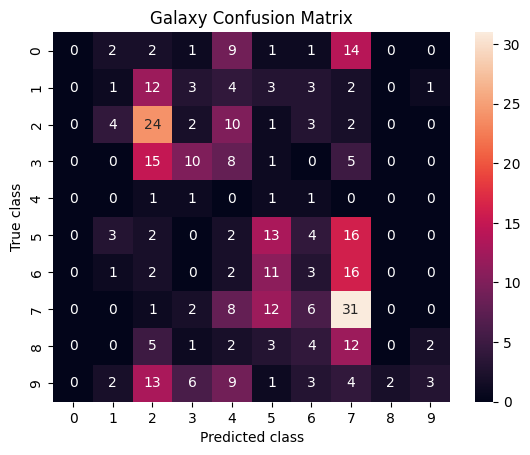

In [ ]:
matrix = confusion_matrix(y_test, predict)
sns.heatmap(matrix, annot=True)
plt.title('Galaxy Confusion Matrix')
plt.xlabel('Predicted class')
plt.ylabel('True class')

In [ ]:
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    # First, we create a model that maps the input image to the activations
    # of the last conv layer as well as the output predictions
    grad_model = keras.models.Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output]
    )

    # Then, we compute the gradient of the top predicted class for our input image
    # with respect to the activations of the last conv layer
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    # This is the gradient of the output neuron (top predicted or chosen)
    # with regard to the output feature map of the last conv layer
    grads = tape.gradient(class_channel, last_conv_layer_output)

    # This is a vector where each entry is the mean intensity of the gradient
    # over a specific feature map channel
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # We multiply each channel in the feature map array
    # by "how important this channel is" with regard to the top predicted class
    # then sum all the channels to obtain the heatmap class activation
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    # For visualization purpose, we will also normalize the heatmap between 0 & 1
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

In [ ]:
model2.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_2 (Conv2D)           (None, 252, 252, 6)       456       
                                                                 
 average_pooling2d_2 (Averag  (None, 126, 126, 6)      0         
 ePooling2D)                                                     
                                                                 
 conv2d_3 (Conv2D)           (None, 122, 122, 16)      2416      
                                                                 
 average_pooling2d_3 (Averag  (None, 61, 61, 16)       0         
 ePooling2D)                                                     
                                                                 
 flatten_1 (Flatten)         (None, 59536)             0         
                                                                 
 dense_3 (Dense)             (None, 120)              

### heatmap for one example

In [ ]:
example_id = 3

imtest = np.expand_dims(x_test[example_id], axis = 0)
Y_test_preds = model2.predict(imtest)

1/1 [==============================] - 0s 54ms/step


In [ ]:
last_conv_layer_name = "conv2d_3"
heatmap = make_gradcam_heatmap(imtest, model2, last_conv_layer_name)
import cv2
heatmap=cv2.resize(heatmap, (x_test[1].shape[1], x_test[1].shape[0]))

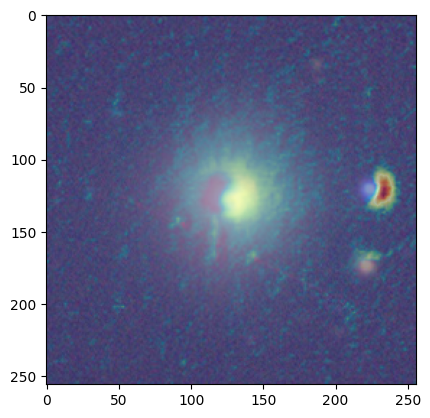

In [ ]:
plt.imshow(np.squeeze(imtest), cmap='Greys')
plt.imshow(heatmap, cmap='Spectral_r', alpha=0.6 )

plt.show()

### heatmap for multiple examples

1/1 [==============================] - 0s 68ms/step


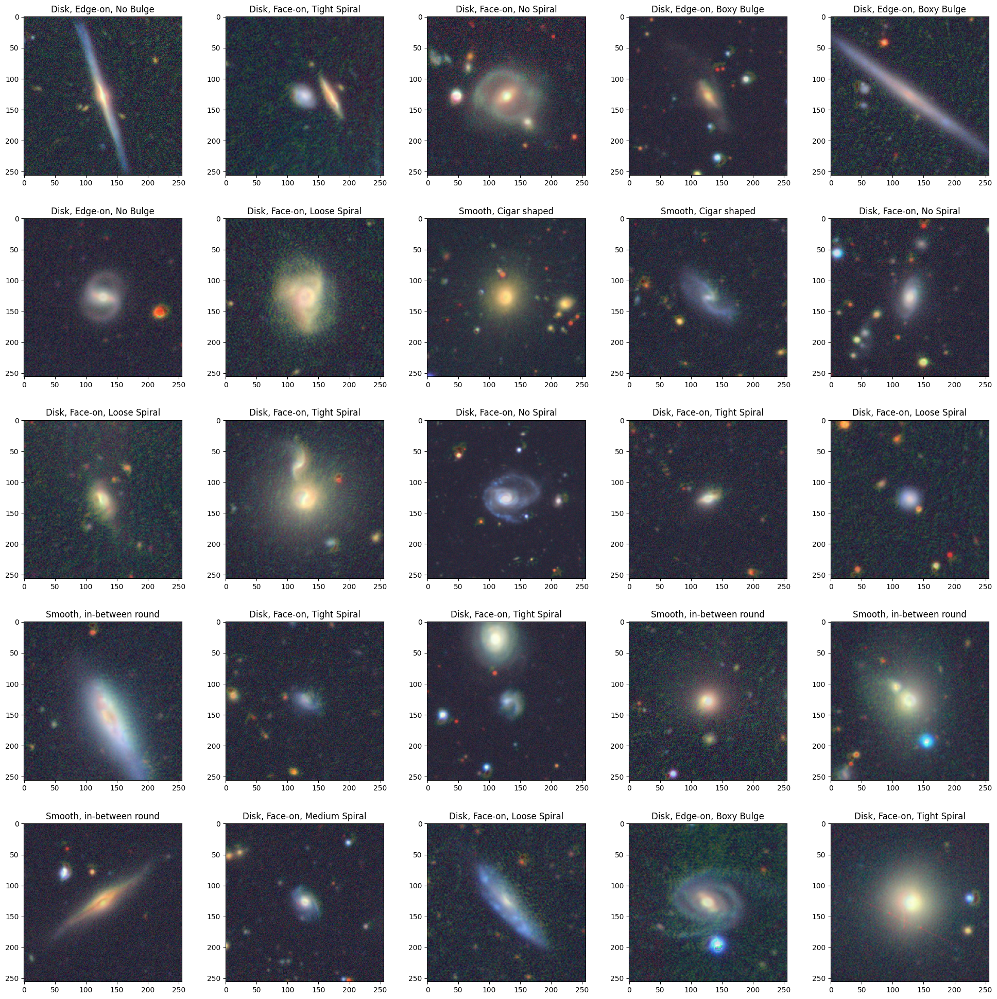

In [ ]:
fig = plt.figure(figsize=(20,20))

for i in range(25):
    plt.subplot(5,5,i+1)
    example_id = i
    imtest = np.expand_dims(x_test[example_id], axis = 0)
    Y_test_preds = model2.predict(imtest)
    last_conv_layer_name = "conv2d_3"
    heatmap = make_gradcam_heatmap(imtest, model2, last_conv_layer_name)
    heatmap =cv2.resize(heatmap, (x_test[i].shape[1], x_test[i].shape[0]))
    plt.imshow(np.squeeze(imtest), cmap='Greys')
    plt.imshow(heatmap, cmap='Spectral_r', alpha=0.2 )
    plt.title(features[y_train[i]])
    fig.tight_layout(pad=3.0)

plt.show()

## Layerwise Relevance Propagation

Maybe also worth looking into. Essentially the same concept as Grad CAMs but more general? Therefore also more complicated to implement.

https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0130140

Unfortunately I was not able to find a good implementation that we could just copy paste here. Will update in case I do end up finding one.